In [1]:
# Import the important libraries
import numpy as np
from google.colab.patches import cv2_imshow # Colab only
import os
import matplotlib.pyplot as plt
import cv2
from tqdm import tqdm
import random
import matplotlib.pyplot as plt
# import the packages
import numpy as np
from PIL import Image
from IPython.display import clear_output
import matplotlib.pyplot as plt

# import PyTorch (Deep Learning lib)
import torch
import torch.nn as nn
import torch.nn.functional as F

import math

In [2]:
# Colab only
# download and install Pytorch
!pip install torch torchvision
!pip install bm3d # for the second methods 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 13.8 MB/s eta 0:00:00


On construit la fonction qui permet d'ajouter un bruit gaussien de variance 'var' et de moyenne mean = 0

In [3]:
# fonction qui permet de debruiter une image 
def noisy(image,mean,var):
    row,col,ch= image.shape
    sigma = var**0.5
    gauss = np.random.normal(mean,sigma,(row,col,ch))
    gauss = gauss.reshape(row,col,ch)
    noisy = image + gauss
    return noisy,gauss

On construit 3 listes contenant:
  -  Les images originaux 
  -  Les images bruités par la fonction noisy
  -  Les bruits gaussien pour chaque images

  

In [8]:
X_img_noised_array = [] # liste des images bruités
Y_gaus_array = [] # liste des bruits gaussien des images 
IMAGES = [] # liste contenant les array des images 

# directory of our images (depend de l'emplacement que j'ai choisie)

p = '/content/drive/MyDrive/Denoising_with_Deep_Learning/databaseds68/original/'
for i in tqdm(os.listdir(p)):
  img = cv2.imread(p+i)
  
  # remplir la liste par nos images d'entrée
  IMAGES.append(img)

  # appliquer un bruit gaussien de variance 100 et l'entrainement ca va être sur des images avec ce bruit fixe
  img_noised, gauss = noisy(img,0,100)
  X_img_noised_array.append(img_noised)
  Y_gaus_array.append(gauss)


100%|██████████| 68/68 [00:19<00:00,  3.52it/s]


DCNN reprèsente le nom du réseau de neuronnes qui permet de faire le débruitage

In [12]:
# CNN issue du modèle Unet
class DCNN(nn.Module):
  """Unet segmentation network."""

  def __init__(self, in_channels, out_channels):
    """Init Unet fields."""
    super(DCNN, self).__init__()

    self.in_channels = in_channels

    self.conv1 = nn.Conv2d(in_channels, 64, kernel_size=3, padding=1,dilation=1)
    
    self.conv2 = nn.Conv2d(64, 64, kernel_size=3, padding=2,dilation =2)
    self.bn1 = nn.BatchNorm2d(64)

    self.conv3 = nn.Conv2d(64, 64, kernel_size=3, padding=3,dilation = 3)
    self.bn2 = nn.BatchNorm2d(64)
    self.conv4 = nn.Conv2d(64, 64, kernel_size=3, padding=4,dilation  = 4)
    self.bn3 = nn.BatchNorm2d(64)

    self.conv5 = nn.Conv2d(64, 64, kernel_size=3, padding=3,dilation = 3)
    self.bn4 = nn.BatchNorm2d(64)
    self.conv6 = nn.Conv2d(64, 64, kernel_size=3, padding=2,dilation = 2)
    self.bn5 = nn.BatchNorm2d(64)
    self.conv7 = nn.Conv2d(64, out_channels, kernel_size=3, padding=1,dilation = 1)
    

  def forward(self, x):# fonctions d'activations à appliquer sur les differentes couches du réseau
    """Forward method."""
    
    x1 = F.relu(self.conv1(x))

    x2 = F.relu(self.bn1(self.conv2(x1)))
    x3 = F.relu(self.bn2(self.conv3(x2)))
    x4 = F.relu(self.bn3(self.conv4(x3)))
    x5 = F.relu(self.bn4(self.conv5(x4)))
    x6 = F.relu(self.bn5(self.conv6(x5)))
    
    x7 = self.conv7(x6) 

    return x7


In [10]:
import torch
torch.cuda.is_available()

True

Data augmentation by creating croped images of shapes (64,64) from the initial image we go from 68 images to 1920 images

In [11]:

X_img_crope_rand = []
Y_img_crope_rand = []
for k in tqdm(range(32)):

  for j in range(60):

    jj = random.randint(1,190)

    X_img_crope_rand.append(X_img_noised_array[j][jj:jj+64,jj:jj+64,0])
    Y_img_crope_rand.append(Y_gaus_array[j][jj:jj+64,jj:jj+64,0])


print('nombre d''images : ',len(X_img_crope_rand))


100%|██████████| 32/32 [00:00<00:00, 4387.20it/s]

nombre dimages :  1920


Optimisation du réseau, ne pas réexecuter cette partie, le modele 'model.pt' est déjà compris dans le dossier du projet

In [14]:
# Optimisation du modele en utlisant la descente du gradient stochastique qui 
# donne des resultats meilleures que l'optimisation avec Adam 'Adaptive Moment Estimation'

batch_size = 2 
model = DCNN(1,1)
model.cuda()

optimizer = torch.optim.SGD(model.parameters(), lr=0.01)
LOSS = [] # liste de loss par epochs

for epochs in tqdm(range(100)):
  for i in range(0, len(Y_img_crope_rand), batch_size):

    imageyyy = torch.from_numpy(np.concatenate(Y_img_crope_rand[i:i+batch_size], axis=0)).float().unsqueeze(0)

    inputsyyy = imageyyy[:,:,:].clone()
    imagexxx = torch.from_numpy(np.concatenate(X_img_crope_rand[i:i+batch_size], axis=0).transpose(0,1)).float().unsqueeze(0)
    inputsxxx = imagexxx[:,:,:].clone()

    imagexxx = torch.unsqueeze(imagexxx,0)
    inputsxxx = torch.unsqueeze(inputsxxx,0)
    imageyyy = torch.unsqueeze(imageyyy,0)
    inputsyyy = torch.unsqueeze(inputsyyy,0)

    imageyyy = imageyyy.cuda()
    inputsyyy = inputsyyy.cuda()

    outputs = model(imagexxx.cuda())
    loss = F.mse_loss(outputs, imageyyy)
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

  print("Loss at epoch", epochs, ":", loss.item())

  LOSS.append(loss.item())
    

  1%|          | 1/100 [00:06<09:57,  6.04s/it]

Loss at epoch 0 : 23.925880432128906


  2%|▏         | 2/100 [00:11<09:19,  5.71s/it]

Loss at epoch 1 : 22.77398681640625


  3%|▎         | 3/100 [00:17<09:12,  5.70s/it]

Loss at epoch 2 : 21.690711975097656


  4%|▍         | 4/100 [00:22<09:07,  5.70s/it]

Loss at epoch 3 : 21.271732330322266


  5%|▌         | 5/100 [00:28<08:57,  5.66s/it]

Loss at epoch 4 : 20.682374954223633


  6%|▌         | 6/100 [00:34<09:00,  5.75s/it]

Loss at epoch 5 : 20.377826690673828


  7%|▋         | 7/100 [00:40<08:52,  5.72s/it]

Loss at epoch 6 : 20.214569091796875


  8%|▊         | 8/100 [00:46<08:54,  5.81s/it]

Loss at epoch 7 : 19.909074783325195


  9%|▉         | 9/100 [00:51<08:44,  5.77s/it]

Loss at epoch 8 : 19.653553009033203


 10%|█         | 10/100 [01:00<09:48,  6.54s/it]

Loss at epoch 9 : 19.49613380432129


 11%|█         | 11/100 [01:06<09:51,  6.64s/it]

Loss at epoch 10 : 19.510730743408203


 12%|█▏        | 12/100 [01:12<09:25,  6.42s/it]

Loss at epoch 11 : 19.352693557739258


 13%|█▎        | 13/100 [01:18<08:56,  6.17s/it]

Loss at epoch 12 : 19.178516387939453


 14%|█▍        | 14/100 [01:24<08:38,  6.03s/it]

Loss at epoch 13 : 19.027729034423828


 15%|█▌        | 15/100 [01:29<08:26,  5.96s/it]

Loss at epoch 14 : 18.912628173828125


 16%|█▌        | 16/100 [01:35<08:10,  5.83s/it]

Loss at epoch 15 : 18.70261001586914


 17%|█▋        | 17/100 [01:41<08:05,  5.85s/it]

Loss at epoch 16 : 18.554012298583984


 18%|█▊        | 18/100 [01:46<07:53,  5.77s/it]

Loss at epoch 17 : 18.444765090942383


 19%|█▉        | 19/100 [01:52<07:50,  5.81s/it]

Loss at epoch 18 : 18.35268783569336


 20%|██        | 20/100 [01:58<07:39,  5.74s/it]

Loss at epoch 19 : 18.264636993408203


 21%|██        | 21/100 [02:04<07:34,  5.75s/it]

Loss at epoch 20 : 18.216964721679688


 22%|██▏       | 22/100 [02:10<07:38,  5.88s/it]

Loss at epoch 21 : 18.28827667236328


 23%|██▎       | 23/100 [02:16<07:34,  5.90s/it]

Loss at epoch 22 : 18.26869010925293


 24%|██▍       | 24/100 [02:22<07:28,  5.90s/it]

Loss at epoch 23 : 18.245311737060547


 25%|██▌       | 25/100 [02:27<07:16,  5.82s/it]

Loss at epoch 24 : 18.139781951904297


 26%|██▌       | 26/100 [02:33<07:13,  5.85s/it]

Loss at epoch 25 : 18.117305755615234


 27%|██▋       | 27/100 [02:39<07:01,  5.78s/it]

Loss at epoch 26 : 18.075620651245117


 28%|██▊       | 28/100 [02:45<06:58,  5.82s/it]

Loss at epoch 27 : 18.053503036499023


 29%|██▉       | 29/100 [02:50<06:49,  5.76s/it]

Loss at epoch 28 : 17.989017486572266


 30%|███       | 30/100 [02:56<06:47,  5.82s/it]

Loss at epoch 29 : 18.052715301513672


 31%|███       | 31/100 [03:02<06:46,  5.88s/it]

Loss at epoch 30 : 17.92818832397461


 32%|███▏      | 32/100 [03:08<06:35,  5.81s/it]

Loss at epoch 31 : 17.907745361328125


 33%|███▎      | 33/100 [03:14<06:31,  5.84s/it]

Loss at epoch 32 : 17.82060432434082


 34%|███▍      | 34/100 [03:20<06:20,  5.77s/it]

Loss at epoch 33 : 17.726871490478516


 35%|███▌      | 35/100 [03:25<06:16,  5.79s/it]

Loss at epoch 34 : 17.595142364501953


 36%|███▌      | 36/100 [03:31<06:11,  5.80s/it]

Loss at epoch 35 : 17.618125915527344


 37%|███▋      | 37/100 [03:37<06:02,  5.76s/it]

Loss at epoch 36 : 17.614089965820312


 38%|███▊      | 38/100 [03:43<06:00,  5.81s/it]

Loss at epoch 37 : 17.51466941833496


 39%|███▉      | 39/100 [03:50<06:24,  6.31s/it]

Loss at epoch 38 : 17.503917694091797


 40%|████      | 40/100 [04:00<07:25,  7.42s/it]

Loss at epoch 39 : 17.51388931274414


 41%|████      | 41/100 [04:08<07:14,  7.37s/it]

Loss at epoch 40 : 17.388957977294922


 42%|████▏     | 42/100 [04:14<06:51,  7.09s/it]

Loss at epoch 41 : 17.37078285217285


 43%|████▎     | 43/100 [04:22<07:01,  7.39s/it]

Loss at epoch 42 : 17.34258270263672


 44%|████▍     | 44/100 [04:28<06:24,  6.87s/it]

Loss at epoch 43 : 17.29232406616211


 45%|████▌     | 45/100 [04:34<06:01,  6.58s/it]

Loss at epoch 44 : 17.310077667236328


 46%|████▌     | 46/100 [04:39<05:40,  6.31s/it]

Loss at epoch 45 : 17.27020263671875


 47%|████▋     | 47/100 [04:45<05:24,  6.13s/it]

Loss at epoch 46 : 17.256933212280273


 48%|████▊     | 48/100 [04:51<05:14,  6.05s/it]

Loss at epoch 47 : 17.215194702148438


 49%|████▉     | 49/100 [04:57<05:01,  5.92s/it]

Loss at epoch 48 : 17.222217559814453


 50%|█████     | 50/100 [05:02<04:56,  5.93s/it]

Loss at epoch 49 : 17.231311798095703


 51%|█████     | 51/100 [05:09<05:05,  6.24s/it]

Loss at epoch 50 : 17.25191879272461


 52%|█████▏    | 52/100 [05:16<05:02,  6.30s/it]

Loss at epoch 51 : 17.214641571044922


 53%|█████▎    | 53/100 [05:22<04:49,  6.16s/it]

Loss at epoch 52 : 17.239505767822266


 54%|█████▍    | 54/100 [05:28<04:42,  6.13s/it]

Loss at epoch 53 : 17.17340087890625


 55%|█████▌    | 55/100 [05:34<04:35,  6.12s/it]

Loss at epoch 54 : 17.20366859436035


 56%|█████▌    | 56/100 [05:40<04:27,  6.09s/it]

Loss at epoch 55 : 17.10525894165039


 57%|█████▋    | 57/100 [05:46<04:23,  6.12s/it]

Loss at epoch 56 : 17.121566772460938


 58%|█████▊    | 58/100 [05:53<04:23,  6.27s/it]

Loss at epoch 57 : 17.117359161376953


 59%|█████▉    | 59/100 [05:59<04:20,  6.36s/it]

Loss at epoch 58 : 17.09029769897461


 60%|██████    | 60/100 [06:05<04:08,  6.21s/it]

Loss at epoch 59 : 17.03797149658203


 61%|██████    | 61/100 [06:11<03:58,  6.11s/it]

Loss at epoch 60 : 17.07406234741211


 62%|██████▏   | 62/100 [06:17<03:46,  5.96s/it]

Loss at epoch 61 : 17.066965103149414


 63%|██████▎   | 63/100 [06:23<03:41,  5.99s/it]

Loss at epoch 62 : 17.00723648071289


 64%|██████▍   | 64/100 [06:29<03:36,  6.02s/it]

Loss at epoch 63 : 17.008068084716797


 65%|██████▌   | 65/100 [06:35<03:30,  6.03s/it]

Loss at epoch 64 : 16.997802734375


 66%|██████▌   | 66/100 [06:41<03:25,  6.04s/it]

Loss at epoch 65 : 16.94656753540039


 67%|██████▋   | 67/100 [06:48<03:26,  6.25s/it]

Loss at epoch 66 : 16.98139762878418


 68%|██████▊   | 68/100 [06:54<03:18,  6.20s/it]

Loss at epoch 67 : 16.966552734375


 69%|██████▉   | 69/100 [07:00<03:12,  6.21s/it]

Loss at epoch 68 : 16.99594497680664


 70%|███████   | 70/100 [07:08<03:19,  6.65s/it]

Loss at epoch 69 : 16.956010818481445


 71%|███████   | 71/100 [07:14<03:07,  6.46s/it]

Loss at epoch 70 : 16.9162540435791


 72%|███████▏  | 72/100 [07:19<02:55,  6.25s/it]

Loss at epoch 71 : 16.90850830078125


 73%|███████▎  | 73/100 [07:25<02:43,  6.06s/it]

Loss at epoch 72 : 16.906713485717773


 74%|███████▍  | 74/100 [07:31<02:36,  6.02s/it]

Loss at epoch 73 : 16.889881134033203


 75%|███████▌  | 75/100 [07:37<02:27,  5.90s/it]

Loss at epoch 74 : 16.895002365112305


 76%|███████▌  | 76/100 [07:42<02:21,  5.90s/it]

Loss at epoch 75 : 16.906421661376953


 77%|███████▋  | 77/100 [07:49<02:17,  5.96s/it]

Loss at epoch 76 : 16.84895896911621


 78%|███████▊  | 78/100 [07:54<02:10,  5.93s/it]

Loss at epoch 77 : 16.862857818603516


 79%|███████▉  | 79/100 [08:00<02:03,  5.87s/it]

Loss at epoch 78 : 16.841094970703125


 80%|████████  | 80/100 [08:06<01:56,  5.81s/it]

Loss at epoch 79 : 16.84832763671875


 81%|████████  | 81/100 [08:12<01:52,  5.92s/it]

Loss at epoch 80 : 16.80923843383789


 82%|████████▏ | 82/100 [08:18<01:44,  5.83s/it]

Loss at epoch 81 : 16.806896209716797


 83%|████████▎ | 83/100 [08:24<01:39,  5.86s/it]

Loss at epoch 82 : 16.748184204101562


 84%|████████▍ | 84/100 [08:29<01:33,  5.84s/it]

Loss at epoch 83 : 16.742149353027344


 85%|████████▌ | 85/100 [08:38<01:38,  6.57s/it]

Loss at epoch 84 : 16.751850128173828


 86%|████████▌ | 86/100 [08:43<01:27,  6.28s/it]

Loss at epoch 85 : 16.69577407836914


 87%|████████▋ | 87/100 [08:49<01:20,  6.17s/it]

Loss at epoch 86 : 16.68391227722168


 88%|████████▊ | 88/100 [08:55<01:13,  6.13s/it]

Loss at epoch 87 : 16.68597412109375


 89%|████████▉ | 89/100 [09:01<01:06,  6.01s/it]

Loss at epoch 88 : 16.626611709594727


 90%|█████████ | 90/100 [09:07<00:59,  5.96s/it]

Loss at epoch 89 : 16.611679077148438


 91%|█████████ | 91/100 [09:14<00:57,  6.41s/it]

Loss at epoch 90 : 16.586637496948242


 92%|█████████▏| 92/100 [09:22<00:55,  6.98s/it]

Loss at epoch 91 : 16.576370239257812


 93%|█████████▎| 93/100 [09:28<00:46,  6.68s/it]

Loss at epoch 92 : 16.539390563964844


 94%|█████████▍| 94/100 [09:35<00:39,  6.59s/it]

Loss at epoch 93 : 16.516460418701172


 95%|█████████▌| 95/100 [09:41<00:31,  6.35s/it]

Loss at epoch 94 : 16.53254508972168


 96%|█████████▌| 96/100 [09:47<00:25,  6.48s/it]

Loss at epoch 95 : 16.512317657470703


 97%|█████████▋| 97/100 [09:53<00:18,  6.31s/it]

Loss at epoch 96 : 16.45374870300293


 98%|█████████▊| 98/100 [09:59<00:12,  6.20s/it]

Loss at epoch 97 : 16.444257736206055


 99%|█████████▉| 99/100 [10:05<00:06,  6.02s/it]

Loss at epoch 98 : 16.432432174682617


100%|██████████| 100/100 [10:11<00:00,  6.11s/it]

Loss at epoch 99 : 16.459651947021484


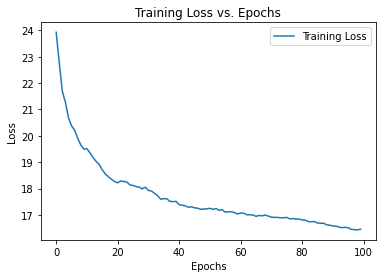

In [16]:
# Metrics

epochs = list(range(100))

# Plot the data
plt.plot(epochs, LOSS, label='Training Loss')

# Add the plot title and axis labels
plt.title("Training Loss vs. Epochs")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()

plt.show()

In [18]:
torch.save(model, '/content/drive/MyDrive/Denoising_with_Deep_Learning/model.pt') # ne pas executer ce ligne de code

faut mettre le fichier model.pt dans le bon repertoire
 dans notre cas notre repertoire c'etait :
 '/content/drive/MyDrive/Denoising_with_Deep_Learning/model.pt'

In [19]:
modell = torch.load( '/content/drive/MyDrive/Denoising_with_Deep_Learning/model.pt') # telechargement du model

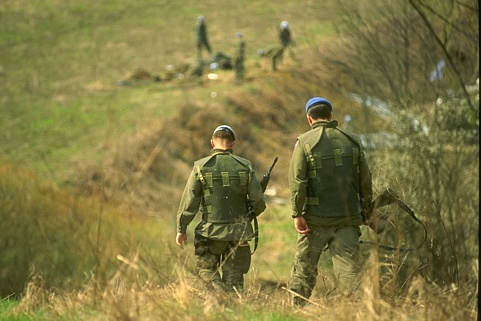

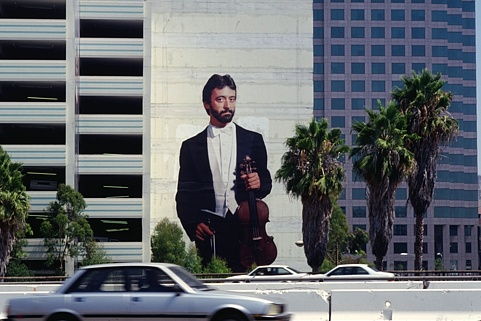

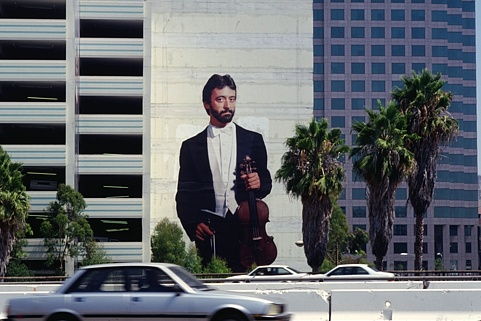

In [20]:
# Les 3 images originaux
original1 = IMAGES[18]
original2 = IMAGES[10]
original3 = IMAGES[5]
cv2_imshow(original1)
cv2_imshow(original2)
cv2_imshow(original2)

In [21]:
# Ecart type du bruit = 10
# images bruité
# 1st image
im1 = X_img_noised_array[18]
# 2nd image
im2 = X_img_noised_array[10]
# 3rd image
im3 = X_img_noised_array[5]

In [22]:
# On choisit 3 images aleatoirement pour voir quantitativement et qualitativement à quoi ressemeble le modele
# calcule de la sortie du model pour im1
imageTEST1 = torch.from_numpy(im1[:,:,0].transpose(0,1)).float().unsqueeze(0)
imageTEST2 = torch.from_numpy(im1[:,:,1].transpose(0,1)).float().unsqueeze(0)
imageTEST3 = torch.from_numpy(im1[:,:,2].transpose(0,1)).float().unsqueeze(0)


imageTEST1 = torch.unsqueeze(imageTEST1,0)
imageTEST2 = torch.unsqueeze(imageTEST2,0)
imageTEST3 = torch.unsqueeze(imageTEST3,0)


outputss1 = modell(imageTEST1.cuda())
outputss2 = modell(imageTEST2.cuda())
outputss3 = modell(imageTEST3.cuda())

outputs_np1 = outputss1.cpu().detach().numpy()[0].transpose(1,2,0)
outputs_np2 = outputss2.cpu().detach().numpy()[0].transpose(1,2,0)
outputs_np3 = outputss3.cpu().detach().numpy()[0].transpose(1,2,0)


output_tot1 = np.zeros(im1.shape) 

output_tot1[:,:,0] = outputs_np1[:,:,0]
output_tot1[:,:,1] = outputs_np2[:,:,0]
output_tot1[:,:,2] = outputs_np3[:,:,0]


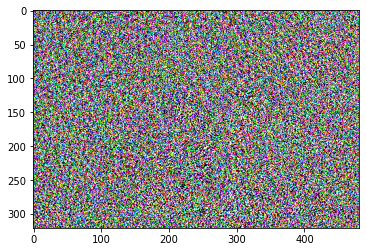

In [23]:
# le bruit estimE par le modele
plt.imshow(output_tot1)
plt.show()

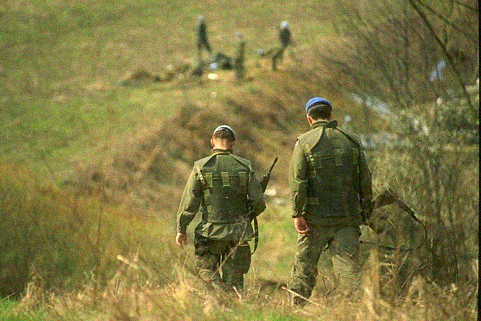

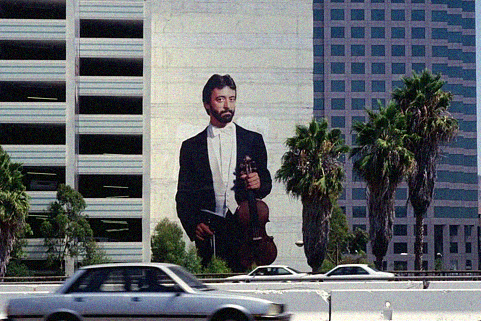

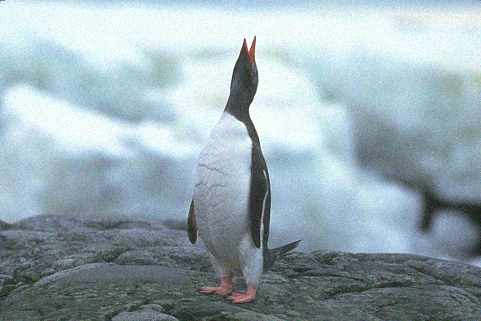

In [24]:
# image 1 bruité par un bruit d'ecart type = 10
cv2_imshow(im1)
cv2_imshow(im2)
cv2_imshow(im3)

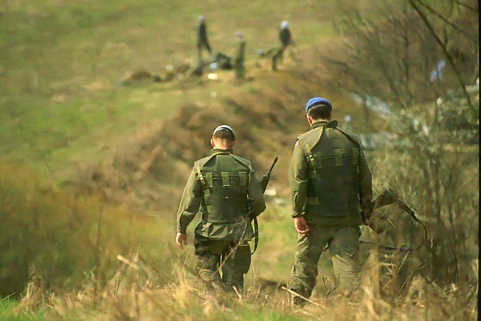

In [25]:
# image 1 débruité
cv2_imshow(abs(-output_tot1+im1))

In [26]:
# Les transformations à faire pour l'image 2 : im2

imageTEST12 = torch.from_numpy(im2[:,:,0].transpose(0,1)).float().unsqueeze(0)
imageTEST22 = torch.from_numpy(im2[:,:,1].transpose(0,1)).float().unsqueeze(0)
imageTEST32 = torch.from_numpy(im2[:,:,2].transpose(0,1)).float().unsqueeze(0)


imageTEST12 = torch.unsqueeze(imageTEST12,0)
imageTEST22 = torch.unsqueeze(imageTEST22,0)
imageTEST32 = torch.unsqueeze(imageTEST32,0)


outputss12 = modell(imageTEST12.cuda())
outputss22 = modell(imageTEST22.cuda())
outputss32 = modell(imageTEST32.cuda())

outputs_np12 = outputss12.cpu().detach().numpy()[0].transpose(1,2,0)
outputs_np22 = outputss22.cpu().detach().numpy()[0].transpose(1,2,0)
outputs_np32 = outputss32.cpu().detach().numpy()[0].transpose(1,2,0)


output_tot2 = np.zeros(im2.shape) 

output_tot2[:,:,0] = outputs_np12[:,:,0]
output_tot2[:,:,1] = outputs_np22[:,:,0]
output_tot2[:,:,2] = outputs_np32[:,:,0]

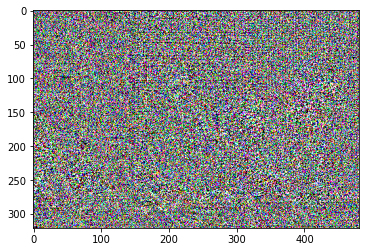

In [27]:
# le bruit estimE par le modele
plt.imshow(output_tot2)
plt.show()

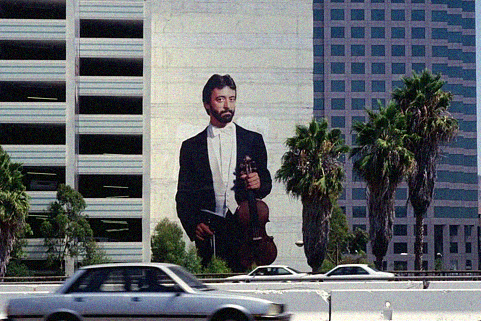

In [28]:
# image 2 bruité
cv2_imshow(im2)

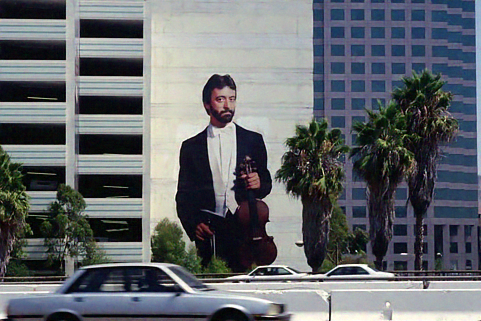

In [29]:
# image 2 débruité
cv2_imshow(abs(-output_tot2+im2))

In [30]:
# Les transformations à faire pour l'image 3 : im3

imageTEST13 = torch.from_numpy(im3[:,:,0].transpose(0,1)).float().unsqueeze(0)
imageTEST23 = torch.from_numpy(im3[:,:,1].transpose(0,1)).float().unsqueeze(0)
imageTEST33 = torch.from_numpy(im3[:,:,2].transpose(0,1)).float().unsqueeze(0)


imageTEST13 = torch.unsqueeze(imageTEST13,0)
imageTEST23 = torch.unsqueeze(imageTEST23,0)
imageTEST33 = torch.unsqueeze(imageTEST33,0)


outputss13 = modell(imageTEST13.cuda())
outputss23 = modell(imageTEST23.cuda())
outputss33 = modell(imageTEST33.cuda())

outputs_np13 = outputss13.cpu().detach().numpy()[0].transpose(1,2,0)
outputs_np23 = outputss23.cpu().detach().numpy()[0].transpose(1,2,0)
outputs_np33 = outputss33.cpu().detach().numpy()[0].transpose(1,2,0)


output_tot3 = np.zeros(im3.shape) 

output_tot3[:,:,0] = outputs_np13[:,:,0]
output_tot3[:,:,1] = outputs_np23[:,:,0]
output_tot3[:,:,2] = outputs_np33[:,:,0]

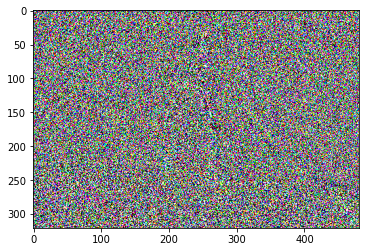

In [31]:
# le bruit estimE par le modele
plt.imshow(output_tot3)
plt.show()

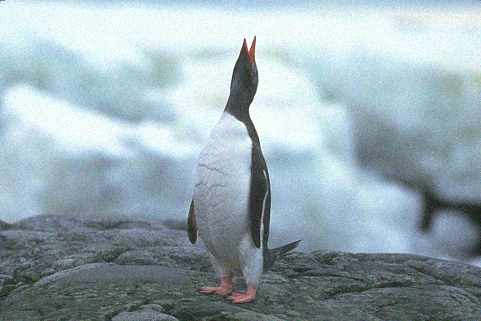

In [32]:
# image 3 bruité
cv2_imshow(im3)

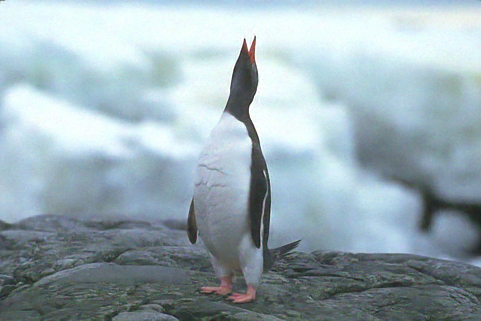

In [33]:
# image 3 débruité
cv2_imshow(abs(-output_tot3+im3))

In [34]:
import bm3d

In [35]:
#Peak Signal to Noise Ratio FUNCTION

def psnr(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:
        return 100
    PIXEL_MAX = 255.0
    return 20 * math.log10(PIXEL_MAX / math.sqrt(mse))

In [37]:
# BRUIT D'ECART TYPE 10
original1 = IMAGES[18]
original2 = IMAGES[10]
original3 = IMAGES[5]

im_debruite1 = abs(-output_tot1+im1)
im_debruite2 = abs(-output_tot2+im2)
im_debruite3 = abs(-output_tot3+im3)

d1 = psnr(original1,im_debruite1)
d2 = psnr(original2,im_debruite2)
d3 = psnr(original3,im_debruite3)

print('PSNR du model ECART-TYPE 10')
print('PSNR_1:',d1,'dB')
print('PSNR_2:',d2,'dB')
print('PSNR_3:',d3,'dB')

PSNR du model ECART-TYPE 10
PSNR_1: 32.661565514997704 dB
PSNR_2: 32.01367610902041 dB
PSNR_3: 34.2980316206145 dB


In [38]:
denoised_image1 = bm3d.bm3d(im1, sigma_psd=10, stage_arg=bm3d.BM3DStages.HARD_THRESHOLDING)
denoised_image2 = bm3d.bm3d(im2, sigma_psd=10, stage_arg=bm3d.BM3DStages.HARD_THRESHOLDING)
denoised_image3 = bm3d.bm3d(im3, sigma_psd=10, stage_arg=bm3d.BM3DStages.HARD_THRESHOLDING)

In [39]:
#Ecart type = 10
d1 = psnr(original1,denoised_image1)
d2 = psnr(original2,denoised_image2)
d3 = psnr(original3,denoised_image3)

print( 'PSNR de la methode bm3d ecartype10:')
print('PSNR_1:',d1,'dB')
print('PSNR_2:',d2,'dB')
print('PSNR_3:',d3,'dB')

PSNR de la methode bm3d ecartype10:
PSNR_1: 33.367791251002636 dB
PSNR_2: 33.090304571597045 dB
PSNR_3: 36.03031707289104 dB


Etude pour le cas du bruit d'écart type = 15

In [40]:

# BRUIT D'ECART TYPE 15

# output_tot1,output_tot2,output_tot3 representent la sortie du modele du débruitage
# des images respective original1,original2,original3

# images originaux
original1 = IMAGES[18]
original2 = IMAGES[10]
original3 = IMAGES[5]

# image bruité par un bruit d'ecart type 15 (VARIANCE = 225) :
im1 = noisy(original1,0,225)[0]
im2 = noisy(original2,0,225)[0]
im3 = noisy(original3,0,225)[0]

## calcule de l'output du modele pour les 3 images

# image 1 : originale 1
##########################################################################

imageTEST1 = torch.from_numpy(im1[:,:,0].transpose(0,1)).float().unsqueeze(0)
imageTEST2 = torch.from_numpy(im1[:,:,1].transpose(0,1)).float().unsqueeze(0)
imageTEST3 = torch.from_numpy(im1[:,:,2].transpose(0,1)).float().unsqueeze(0)


imageTEST1 = torch.unsqueeze(imageTEST1,0)
imageTEST2 = torch.unsqueeze(imageTEST2,0)
imageTEST3 = torch.unsqueeze(imageTEST3,0)


outputss1 = modell(imageTEST1.cuda())
outputss2 = modell(imageTEST2.cuda())
outputss3 = modell(imageTEST3.cuda())

outputs_np1 = outputss1.cpu().detach().numpy()[0].transpose(1,2,0)
outputs_np2 = outputss2.cpu().detach().numpy()[0].transpose(1,2,0)
outputs_np3 = outputss3.cpu().detach().numpy()[0].transpose(1,2,0)


output_tot1 = np.zeros(im1.shape) 

output_tot1[:,:,0] = outputs_np1[:,:,0]
output_tot1[:,:,1] = outputs_np2[:,:,0]
output_tot1[:,:,2] = outputs_np3[:,:,0]
##############################################################################

# image 2 originale2

imageTEST12 = torch.from_numpy(im2[:,:,0].transpose(0,1)).float().unsqueeze(0)
imageTEST22 = torch.from_numpy(im2[:,:,1].transpose(0,1)).float().unsqueeze(0)
imageTEST32 = torch.from_numpy(im2[:,:,2].transpose(0,1)).float().unsqueeze(0)


imageTEST12 = torch.unsqueeze(imageTEST12,0)
imageTEST22 = torch.unsqueeze(imageTEST22,0)
imageTEST32 = torch.unsqueeze(imageTEST32,0)


outputss12 = modell(imageTEST12.cuda())
outputss22 = modell(imageTEST22.cuda())
outputss32 = modell(imageTEST32.cuda())

outputs_np12 = outputss12.cpu().detach().numpy()[0].transpose(1,2,0)
outputs_np22 = outputss22.cpu().detach().numpy()[0].transpose(1,2,0)
outputs_np32 = outputss32.cpu().detach().numpy()[0].transpose(1,2,0)


output_tot2 = np.zeros(im2.shape) 

output_tot2[:,:,0] = outputs_np12[:,:,0]
output_tot2[:,:,1] = outputs_np22[:,:,0]
output_tot2[:,:,2] = outputs_np32[:,:,0]
###############################################################################
# image 3:  originale3
imageTEST13 = torch.from_numpy(im3[:,:,0].transpose(0,1)).float().unsqueeze(0)
imageTEST23 = torch.from_numpy(im3[:,:,1].transpose(0,1)).float().unsqueeze(0)
imageTEST33 = torch.from_numpy(im3[:,:,2].transpose(0,1)).float().unsqueeze(0)


imageTEST13 = torch.unsqueeze(imageTEST13,0)
imageTEST23 = torch.unsqueeze(imageTEST23,0)
imageTEST33 = torch.unsqueeze(imageTEST33,0)


outputss13 = modell(imageTEST13.cuda())
outputss23 = modell(imageTEST23.cuda())
outputss33 = modell(imageTEST33.cuda())

outputs_np13 = outputss13.cpu().detach().numpy()[0].transpose(1,2,0)
outputs_np23 = outputss23.cpu().detach().numpy()[0].transpose(1,2,0)
outputs_np33 = outputss33.cpu().detach().numpy()[0].transpose(1,2,0)


output_tot3 = np.zeros(im3.shape) 

output_tot3[:,:,0] = outputs_np13[:,:,0]
output_tot3[:,:,1] = outputs_np23[:,:,0]
output_tot3[:,:,2] = outputs_np33[:,:,0]
############################################################################




im_debruite1 = abs(-output_tot1+im1)
im_debruite2 = abs(-output_tot2+im2)
im_debruite3 = abs(-output_tot3+im3)

d1 = psnr(original1,im_debruite1)
d2 = psnr(original2,im_debruite2)
d3 = psnr(original3,im_debruite3)

print('PSNR du model ecart type = 15 :')
print('PSNR_1:',d1,'dB')
print('PSNR_2:',d2,'dB')
print('PSNR_3:',d3,'dB')

print('2eme methode')
### PSNR du methode bm3d

denoised_image1 = bm3d.bm3d(im1, sigma_psd=10, stage_arg=bm3d.BM3DStages.HARD_THRESHOLDING)
denoised_image2 = bm3d.bm3d(im2, sigma_psd=10, stage_arg=bm3d.BM3DStages.HARD_THRESHOLDING)
denoised_image3 = bm3d.bm3d(im3, sigma_psd=10, stage_arg=bm3d.BM3DStages.HARD_THRESHOLDING)


d1 = psnr(original1,denoised_image1)
d2 = psnr(original2,denoised_image2)
d3 = psnr(original3,denoised_image3)

print('PSNR du bm3d ecart type = 15 :')
print('PSNR_1:',d1,'dB')
print('PSNR_2:',d2,'dB')
print('PSNR_3:',d3,'dB')



PSNR du model ecart type = 15 :
PSNR_1: 29.35062569244024 dB
PSNR_2: 28.813233059799717 dB
PSNR_3: 30.40377476713472 dB
2eme methode
PSNR du bm3d ecart type = 15 :
PSNR_1: 30.75404498384011 dB
PSNR_2: 30.286247046571656 dB
PSNR_3: 32.642485179576376 dB


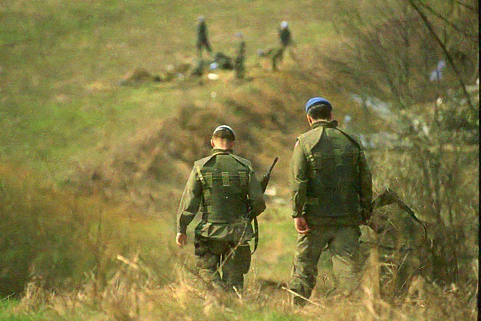

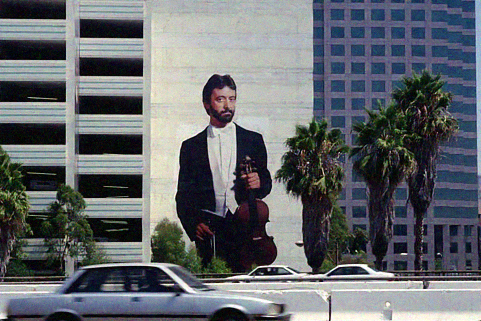

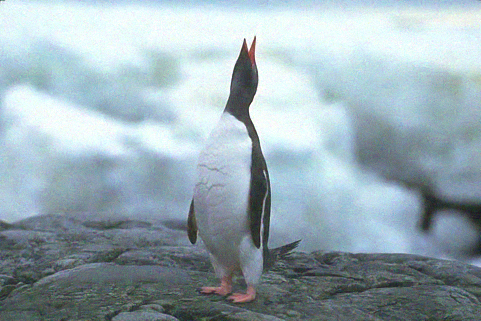

In [41]:
# On garde le même modele entrainé sur un bruit de variance 100 et on visualise que
# le debruitage n'est pas assez bon pour un bruit d'ecart type 15 (var 225)
cv2_imshow(im_debruite1)
cv2_imshow(im_debruite2)
cv2_imshow(im_debruite3)

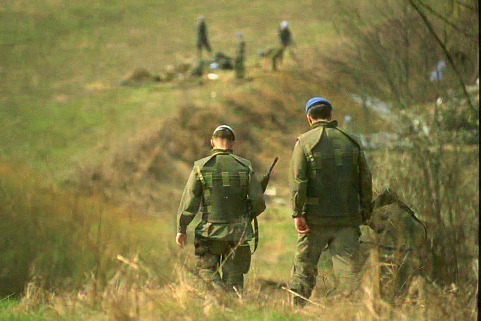

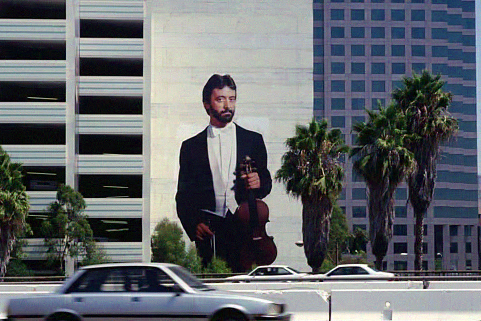

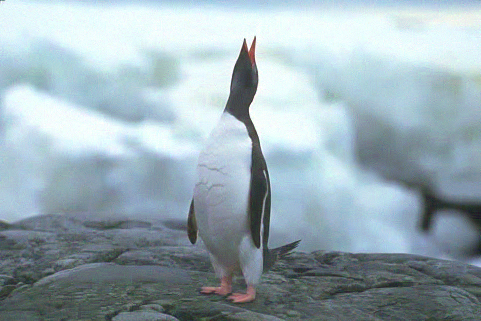

In [42]:
# debruitage d'image ( ecartype de bruit = 15 ) par bm3d sans changer les parametres de le fonction bm3d
cv2_imshow(denoised_image1)
cv2_imshow(denoised_image2)
cv2_imshow(denoised_image3)

BRUIT D'ECART TYPE 20

In [43]:

# BRUIT D'ECART TYPE 20

# output_tot1,output_tot2,output_tot3 representent la sortie du modele du débruitage
# des images respective original1,original2,original3

# images originaux
original1 = IMAGES[18]
original2 = IMAGES[10]
original3 = IMAGES[5]

# image bruité par un bruit d'ecart type 20 (VARIANCE = 400) :
im1 = noisy(original1,0,400)[0]
im2 = noisy(original2,0,400)[0]
im3 = noisy(original3,0,400)[0]

## calcule de l'output du modele pour les 3 images

# image 1 : originale 1
##########################################################################

imageTEST1 = torch.from_numpy(im1[:,:,0].transpose(0,1)).float().unsqueeze(0)
imageTEST2 = torch.from_numpy(im1[:,:,1].transpose(0,1)).float().unsqueeze(0)
imageTEST3 = torch.from_numpy(im1[:,:,2].transpose(0,1)).float().unsqueeze(0)


imageTEST1 = torch.unsqueeze(imageTEST1,0)
imageTEST2 = torch.unsqueeze(imageTEST2,0)
imageTEST3 = torch.unsqueeze(imageTEST3,0)


outputss1 = modell(imageTEST1.cuda())
outputss2 = modell(imageTEST2.cuda())
outputss3 = modell(imageTEST3.cuda())

outputs_np1 = outputss1.cpu().detach().numpy()[0].transpose(1,2,0)
outputs_np2 = outputss2.cpu().detach().numpy()[0].transpose(1,2,0)
outputs_np3 = outputss3.cpu().detach().numpy()[0].transpose(1,2,0)


output_tot1 = np.zeros(im1.shape) 

output_tot1[:,:,0] = outputs_np1[:,:,0]
output_tot1[:,:,1] = outputs_np2[:,:,0]
output_tot1[:,:,2] = outputs_np3[:,:,0]
##############################################################################

# image 2 originale2

imageTEST12 = torch.from_numpy(im2[:,:,0].transpose(0,1)).float().unsqueeze(0)
imageTEST22 = torch.from_numpy(im2[:,:,1].transpose(0,1)).float().unsqueeze(0)
imageTEST32 = torch.from_numpy(im2[:,:,2].transpose(0,1)).float().unsqueeze(0)


imageTEST12 = torch.unsqueeze(imageTEST12,0)
imageTEST22 = torch.unsqueeze(imageTEST22,0)
imageTEST32 = torch.unsqueeze(imageTEST32,0)


outputss12 = modell(imageTEST12.cuda())
outputss22 = modell(imageTEST22.cuda())
outputss32 = modell(imageTEST32.cuda())

outputs_np12 = outputss12.cpu().detach().numpy()[0].transpose(1,2,0)
outputs_np22 = outputss22.cpu().detach().numpy()[0].transpose(1,2,0)
outputs_np32 = outputss32.cpu().detach().numpy()[0].transpose(1,2,0)


output_tot2 = np.zeros(im2.shape) 

output_tot2[:,:,0] = outputs_np12[:,:,0]
output_tot2[:,:,1] = outputs_np22[:,:,0]
output_tot2[:,:,2] = outputs_np32[:,:,0]
###############################################################################
# image 3:  originale3
imageTEST13 = torch.from_numpy(im3[:,:,0].transpose(0,1)).float().unsqueeze(0)
imageTEST23 = torch.from_numpy(im3[:,:,1].transpose(0,1)).float().unsqueeze(0)
imageTEST33 = torch.from_numpy(im3[:,:,2].transpose(0,1)).float().unsqueeze(0)


imageTEST13 = torch.unsqueeze(imageTEST13,0)
imageTEST23 = torch.unsqueeze(imageTEST23,0)
imageTEST33 = torch.unsqueeze(imageTEST33,0)


outputss13 = modell(imageTEST13.cuda())
outputss23 = modell(imageTEST23.cuda())
outputss33 = modell(imageTEST33.cuda())

outputs_np13 = outputss13.cpu().detach().numpy()[0].transpose(1,2,0)
outputs_np23 = outputss23.cpu().detach().numpy()[0].transpose(1,2,0)
outputs_np33 = outputss33.cpu().detach().numpy()[0].transpose(1,2,0)


output_tot3 = np.zeros(im3.shape) 

output_tot3[:,:,0] = outputs_np13[:,:,0]
output_tot3[:,:,1] = outputs_np23[:,:,0]
output_tot3[:,:,2] = outputs_np33[:,:,0]
############################################################################




im_debruite1 = abs(-output_tot1+im1)
im_debruite2 = abs(-output_tot2+im2)
im_debruite3 = abs(-output_tot3+im3)

d1 = psnr(original1,im_debruite1)
d2 = psnr(original2,im_debruite2)
d3 = psnr(original3,im_debruite3)

print('PSNR du model ecart type = 20 :')
print('PSNR_1:',d1,'dB')
print('PSNR_2:',d2,'dB')
print('PSNR_3:',d3,'dB')

print('2eme methode')
### PSNR du methode bm3d

denoised_image1 = bm3d.bm3d(im1, sigma_psd=10, stage_arg=bm3d.BM3DStages.HARD_THRESHOLDING)
denoised_image2 = bm3d.bm3d(im2, sigma_psd=10, stage_arg=bm3d.BM3DStages.HARD_THRESHOLDING)
denoised_image3 = bm3d.bm3d(im3, sigma_psd=10, stage_arg=bm3d.BM3DStages.HARD_THRESHOLDING)


d1 = psnr(original1,denoised_image1)
d2 = psnr(original2,denoised_image2)
d3 = psnr(original3,denoised_image3)

print('PSNR du bm3d ecart type = 20 :')
print('PSNR_1:',d1,'dB')
print('PSNR_2:',d2,'dB')
print('PSNR_3:',d3,'dB')

PSNR du model ecart type = 20 :
PSNR_1: 26.010731112043178 dB
PSNR_2: 25.78540495668384 dB
PSNR_3: 26.546387661258827 dB
2eme methode
PSNR du bm3d ecart type = 20 :
PSNR_1: 26.288962873723094 dB
PSNR_2: 25.992628864128015 dB
PSNR_3: 27.027000461443144 dB


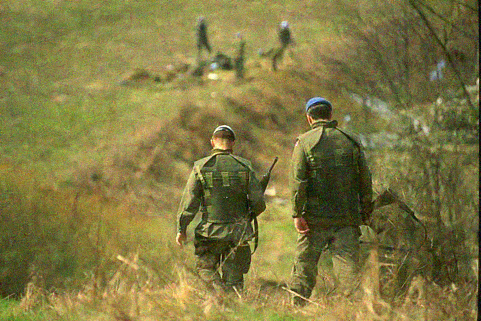

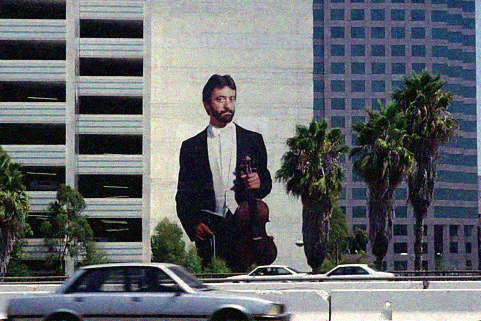

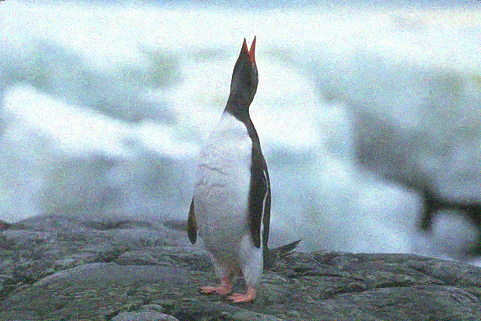

In [44]:
# De même on garde le même modele entrainé sur un bruit de variance 100 et on visualise que
# le debruitage n'est pas assez bon pour un bruit d'ecart type 20 (var 400)
cv2_imshow(im_debruite1)
cv2_imshow(im_debruite2)
cv2_imshow(im_debruite3)

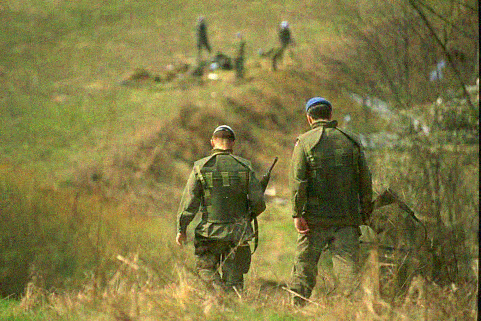

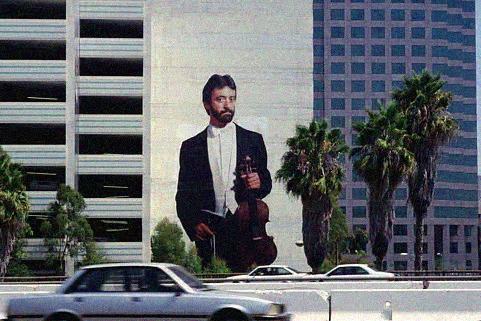

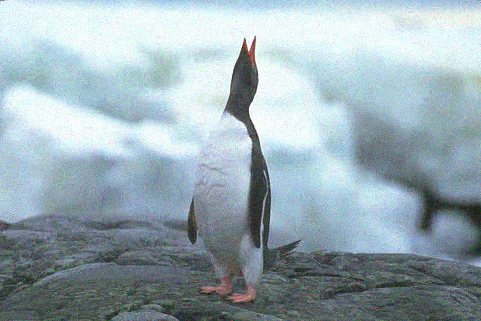

In [45]:
# debruitage d'image ( ecartype de bruit = 20 ) par bm3d sans changer les parametres de le fonction bm3d
cv2_imshow(denoised_image1)
cv2_imshow(denoised_image2)
cv2_imshow(denoised_image3)

Etude avec un bruit d'ecart type = 25

In [46]:
# BRUIT D'ECART TYPE 25

# output_tot1,output_tot2,output_tot3 representent la sortie du modele du débruitage
# des images respective original1,original2,original3

# images originaux
original1 = IMAGES[18]
original2 = IMAGES[10]
original3 = IMAGES[5]

# image bruité par un bruit d'ecart type 15 (VARIANCE = 225) :
im1 = noisy(original1,0,625)[0]
im2 = noisy(original2,0,625)[0]
im3 = noisy(original3,0,625)[0]

## calcule de l'output du modele pour les 3 images

# image 1 : originale 1
##########################################################################

imageTEST1 = torch.from_numpy(im1[:,:,0].transpose(0,1)).float().unsqueeze(0)
imageTEST2 = torch.from_numpy(im1[:,:,1].transpose(0,1)).float().unsqueeze(0)
imageTEST3 = torch.from_numpy(im1[:,:,2].transpose(0,1)).float().unsqueeze(0)


imageTEST1 = torch.unsqueeze(imageTEST1,0)
imageTEST2 = torch.unsqueeze(imageTEST2,0)
imageTEST3 = torch.unsqueeze(imageTEST3,0)


outputss1 = modell(imageTEST1.cuda())
outputss2 = modell(imageTEST2.cuda())
outputss3 = modell(imageTEST3.cuda())

outputs_np1 = outputss1.cpu().detach().numpy()[0].transpose(1,2,0)
outputs_np2 = outputss2.cpu().detach().numpy()[0].transpose(1,2,0)
outputs_np3 = outputss3.cpu().detach().numpy()[0].transpose(1,2,0)


output_tot1 = np.zeros(im1.shape) 

output_tot1[:,:,0] = outputs_np1[:,:,0]
output_tot1[:,:,1] = outputs_np2[:,:,0]
output_tot1[:,:,2] = outputs_np3[:,:,0]
##############################################################################

# image 2 originale2

imageTEST12 = torch.from_numpy(im2[:,:,0].transpose(0,1)).float().unsqueeze(0)
imageTEST22 = torch.from_numpy(im2[:,:,1].transpose(0,1)).float().unsqueeze(0)
imageTEST32 = torch.from_numpy(im2[:,:,2].transpose(0,1)).float().unsqueeze(0)


imageTEST12 = torch.unsqueeze(imageTEST12,0)
imageTEST22 = torch.unsqueeze(imageTEST22,0)
imageTEST32 = torch.unsqueeze(imageTEST32,0)


outputss12 = modell(imageTEST12.cuda())
outputss22 = modell(imageTEST22.cuda())
outputss32 = modell(imageTEST32.cuda())

outputs_np12 = outputss12.cpu().detach().numpy()[0].transpose(1,2,0)
outputs_np22 = outputss22.cpu().detach().numpy()[0].transpose(1,2,0)
outputs_np32 = outputss32.cpu().detach().numpy()[0].transpose(1,2,0)


output_tot2 = np.zeros(im2.shape) 

output_tot2[:,:,0] = outputs_np12[:,:,0]
output_tot2[:,:,1] = outputs_np22[:,:,0]
output_tot2[:,:,2] = outputs_np32[:,:,0]
###############################################################################
# image 3:  originale3
imageTEST13 = torch.from_numpy(im3[:,:,0].transpose(0,1)).float().unsqueeze(0)
imageTEST23 = torch.from_numpy(im3[:,:,1].transpose(0,1)).float().unsqueeze(0)
imageTEST33 = torch.from_numpy(im3[:,:,2].transpose(0,1)).float().unsqueeze(0)


imageTEST13 = torch.unsqueeze(imageTEST13,0)
imageTEST23 = torch.unsqueeze(imageTEST23,0)
imageTEST33 = torch.unsqueeze(imageTEST33,0)


outputss13 = modell(imageTEST13.cuda())
outputss23 = modell(imageTEST23.cuda())
outputss33 = modell(imageTEST33.cuda())

outputs_np13 = outputss13.cpu().detach().numpy()[0].transpose(1,2,0)
outputs_np23 = outputss23.cpu().detach().numpy()[0].transpose(1,2,0)
outputs_np33 = outputss33.cpu().detach().numpy()[0].transpose(1,2,0)


output_tot3 = np.zeros(im3.shape) 

output_tot3[:,:,0] = outputs_np13[:,:,0]
output_tot3[:,:,1] = outputs_np23[:,:,0]
output_tot3[:,:,2] = outputs_np33[:,:,0]
############################################################################




im_debruite1 = abs(-output_tot1+im1)
im_debruite2 = abs(-output_tot2+im2)
im_debruite3 = abs(-output_tot3+im3)

d1 = psnr(original1,im_debruite1)
d2 = psnr(original2,im_debruite2)
d3 = psnr(original3,im_debruite3)

print('PSNR du model ecart type = 25 :')
print('PSNR_1:',d1,'dB')
print('PSNR_2:',d2,'dB')
print('PSNR_3:',d3,'dB')

print('2eme methode')
### PSNR du methode bm3d

denoised_image1 = bm3d.bm3d(im1, sigma_psd=10, stage_arg=bm3d.BM3DStages.HARD_THRESHOLDING)
denoised_image2 = bm3d.bm3d(im2, sigma_psd=10, stage_arg=bm3d.BM3DStages.HARD_THRESHOLDING)
denoised_image3 = bm3d.bm3d(im3, sigma_psd=10, stage_arg=bm3d.BM3DStages.HARD_THRESHOLDING)


d1 = psnr(original1,denoised_image1)
d2 = psnr(original2,denoised_image2)
d3 = psnr(original3,denoised_image3)

print('PSNR du bm3d ecart type = 25 :')
print('PSNR_1:',d1,'dB')
print('PSNR_2:',d2,'dB')
print('PSNR_3:',d3,'dB')

PSNR du model ecart type = 25 :
PSNR_1: 23.351131586983527 dB
PSNR_2: 23.344919145179897 dB
PSNR_3: 23.646692892357308 dB
2eme methode
PSNR du bm3d ecart type = 25 :
PSNR_1: 22.79671452745347 dB
PSNR_2: 22.6126500700786 dB
PSNR_3: 23.107492597752163 dB


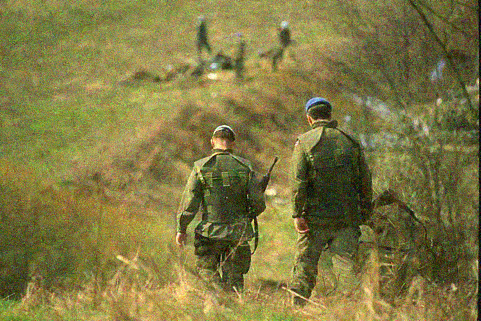

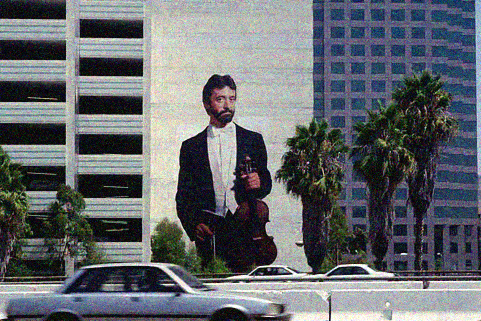

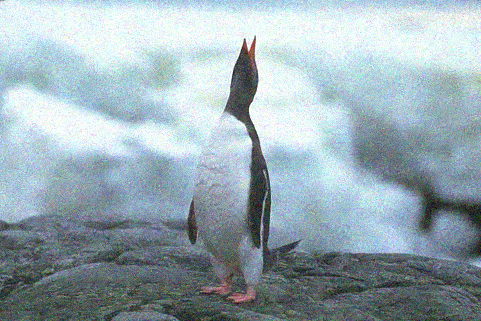

In [47]:
# De même on garde le même modele entrainé sur un bruit de variance 100 et on visualise que
# le debruitage n'est pas assez bon pour un bruit d'ecart type 25 (var 625)
cv2_imshow(im_debruite1)
cv2_imshow(im_debruite2)
cv2_imshow(im_debruite3)

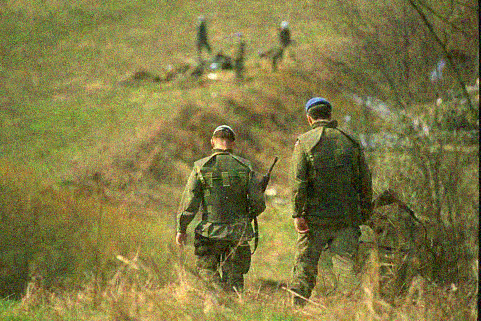

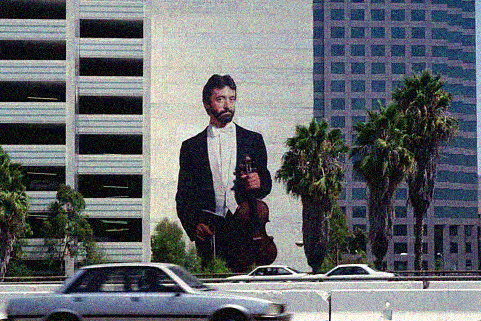

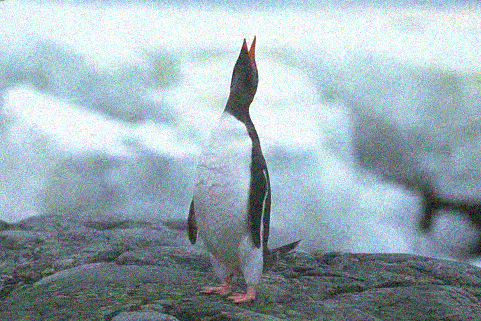

In [48]:
# debruitage d'image ( ecartype de bruit = 25 ) par bm3d sans changer les parametres de le fonction bm3d
cv2_imshow(denoised_image1)
cv2_imshow(denoised_image2)
cv2_imshow(denoised_image3)


BRUIT D'ECART TYPE 50



In [49]:
# BRUIT D'ECART TYPE 50

# output_tot1,output_tot2,output_tot3 representent la sortie du modele du débruitage
# des images respective original1,original2,original3

# images originaux
original1 = IMAGES[18]
original2 = IMAGES[10]
original3 = IMAGES[5]

# image bruité par un bruit d'ecart type 50 (VARIANCE = 2500) :
im1 = noisy(original1,0,2500)[0]
im2 = noisy(original2,0,2500)[0]
im3 = noisy(original3,0,2500)[0]

## calcule de l'output du modele pour les 3 images

# image 1 : originale 1
##########################################################################

imageTEST1 = torch.from_numpy(im1[:,:,0].transpose(0,1)).float().unsqueeze(0)
imageTEST2 = torch.from_numpy(im1[:,:,1].transpose(0,1)).float().unsqueeze(0)
imageTEST3 = torch.from_numpy(im1[:,:,2].transpose(0,1)).float().unsqueeze(0)


imageTEST1 = torch.unsqueeze(imageTEST1,0)
imageTEST2 = torch.unsqueeze(imageTEST2,0)
imageTEST3 = torch.unsqueeze(imageTEST3,0)


outputss1 = modell(imageTEST1.cuda())
outputss2 = modell(imageTEST2.cuda())
outputss3 = modell(imageTEST3.cuda())

outputs_np1 = outputss1.cpu().detach().numpy()[0].transpose(1,2,0)
outputs_np2 = outputss2.cpu().detach().numpy()[0].transpose(1,2,0)
outputs_np3 = outputss3.cpu().detach().numpy()[0].transpose(1,2,0)


output_tot1 = np.zeros(im1.shape) 

output_tot1[:,:,0] = outputs_np1[:,:,0]
output_tot1[:,:,1] = outputs_np2[:,:,0]
output_tot1[:,:,2] = outputs_np3[:,:,0]
##############################################################################

# image 2 originale2

imageTEST12 = torch.from_numpy(im2[:,:,0].transpose(0,1)).float().unsqueeze(0)
imageTEST22 = torch.from_numpy(im2[:,:,1].transpose(0,1)).float().unsqueeze(0)
imageTEST32 = torch.from_numpy(im2[:,:,2].transpose(0,1)).float().unsqueeze(0)


imageTEST12 = torch.unsqueeze(imageTEST12,0)
imageTEST22 = torch.unsqueeze(imageTEST22,0)
imageTEST32 = torch.unsqueeze(imageTEST32,0)


outputss12 = modell(imageTEST12.cuda())
outputss22 = modell(imageTEST22.cuda())
outputss32 = modell(imageTEST32.cuda())

outputs_np12 = outputss12.cpu().detach().numpy()[0].transpose(1,2,0)
outputs_np22 = outputss22.cpu().detach().numpy()[0].transpose(1,2,0)
outputs_np32 = outputss32.cpu().detach().numpy()[0].transpose(1,2,0)


output_tot2 = np.zeros(im2.shape) 

output_tot2[:,:,0] = outputs_np12[:,:,0]
output_tot2[:,:,1] = outputs_np22[:,:,0]
output_tot2[:,:,2] = outputs_np32[:,:,0]
###############################################################################
# image 3:  originale3
imageTEST13 = torch.from_numpy(im3[:,:,0].transpose(0,1)).float().unsqueeze(0)
imageTEST23 = torch.from_numpy(im3[:,:,1].transpose(0,1)).float().unsqueeze(0)
imageTEST33 = torch.from_numpy(im3[:,:,2].transpose(0,1)).float().unsqueeze(0)


imageTEST13 = torch.unsqueeze(imageTEST13,0)
imageTEST23 = torch.unsqueeze(imageTEST23,0)
imageTEST33 = torch.unsqueeze(imageTEST33,0)


outputss13 = modell(imageTEST13.cuda())
outputss23 = modell(imageTEST23.cuda())
outputss33 = modell(imageTEST33.cuda())

outputs_np13 = outputss13.cpu().detach().numpy()[0].transpose(1,2,0)
outputs_np23 = outputss23.cpu().detach().numpy()[0].transpose(1,2,0)
outputs_np33 = outputss33.cpu().detach().numpy()[0].transpose(1,2,0)


output_tot3 = np.zeros(im3.shape) 

output_tot3[:,:,0] = outputs_np13[:,:,0]
output_tot3[:,:,1] = outputs_np23[:,:,0]
output_tot3[:,:,2] = outputs_np33[:,:,0]
############################################################################




im_debruite1 = abs(-output_tot1+im1)
im_debruite2 = abs(-output_tot2+im2)
im_debruite3 = abs(-output_tot3+im3)

d1 = psnr(original1,im_debruite1)
d2 = psnr(original2,im_debruite2)
d3 = psnr(original3,im_debruite3)

print('PSNR du model ecart type = 50 :')
print('PSNR_1:',d1,'dB')
print('PSNR_2:',d2,'dB')
print('PSNR_3:',d3,'dB')

print('2eme methode')
### PSNR du methode bm3d

denoised_image1 = bm3d.bm3d(im1, sigma_psd=10, stage_arg=bm3d.BM3DStages.HARD_THRESHOLDING)
denoised_image2 = bm3d.bm3d(im2, sigma_psd=10, stage_arg=bm3d.BM3DStages.HARD_THRESHOLDING)
denoised_image3 = bm3d.bm3d(im3, sigma_psd=10, stage_arg=bm3d.BM3DStages.HARD_THRESHOLDING)


d1 = psnr(original1,denoised_image1)
d2 = psnr(original2,denoised_image2)
d3 = psnr(original3,denoised_image3)

print('PSNR du bm3d ecart type = 50 :')
print('PSNR_1:',d1,'dB')
print('PSNR_2:',d2,'dB')
print('PSNR_3:',d3,'dB')

PSNR du model ecart type = 50 :
PSNR_1: 16.0400014459885 dB
PSNR_2: 16.223171929087123 dB
PSNR_3: 15.84292645570798 dB
2eme methode
PSNR du bm3d ecart type = 50 :
PSNR_1: 14.598839914364877 dB
PSNR_2: 14.591567870878034 dB
PSNR_3: 14.62408972427243 dB


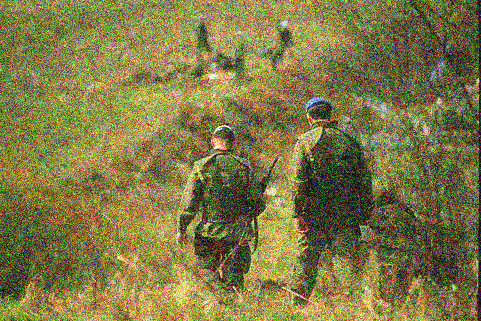

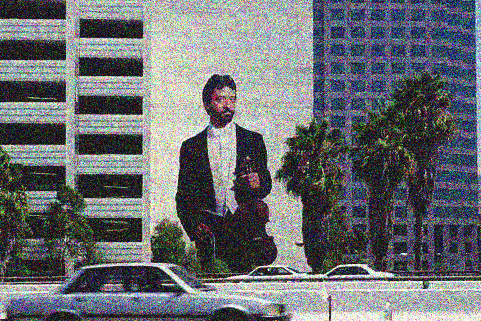

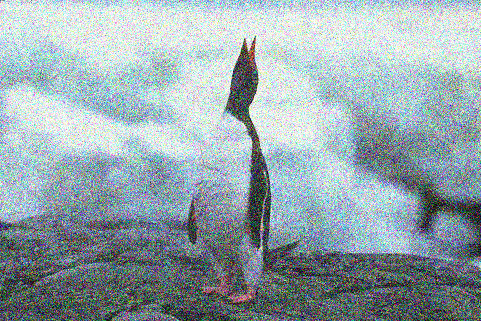

In [50]:
# De même on garde le même modele entrainé sur un bruit de variance 100 et on visualise que
# le debruitage n'est pas assez bon pour un bruit d'ecart type 50 (var 2500)
cv2_imshow(im_debruite1)
cv2_imshow(im_debruite2)
cv2_imshow(im_debruite3)

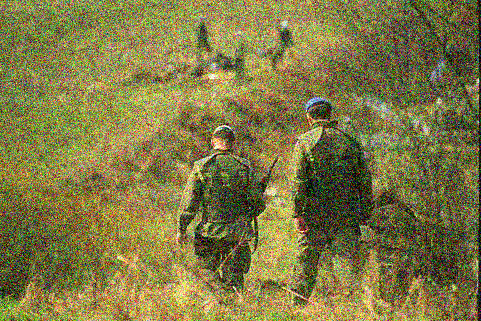

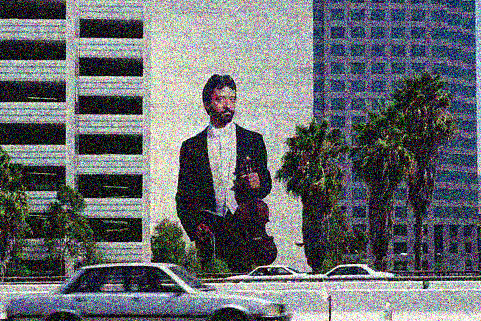

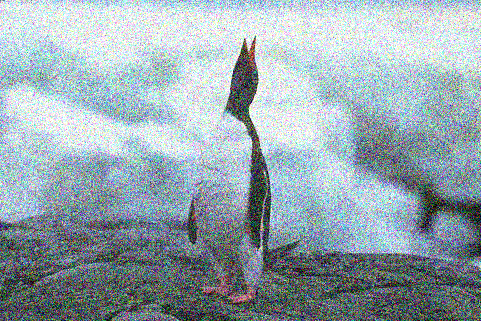

In [51]:
# debruitage d'image ( ecartype de bruit = 50 ) par bm3d sans changer les parametres de le fonction bm3d
cv2_imshow(denoised_image1)
cv2_imshow(denoised_image2)
cv2_imshow(denoised_image3)